# État des lieux des lycées en Occitanie

# PARTIE 1 : Importer, transformer et nettoyer les données nécessaires à l'analyse

## DATAFRAME DES ANNUAIRES

### Import data annuaire from api

In [1]:
#importing necessary packages
import pandas as pd
import requests
import json

# get data
#creating the url
url = 'https://data.occitanie.education.gouv.fr/api/records/1.0/search/?dataset=fr-en-annuaire-education&q=&rows=10000&facet=identifiant_de_l_etablissement&facet=nom_etablissement&facet=type_etablissement&facet=statut_public_prive&facet=code_postal&facet=code_commune&facet=nom_commune&facet=code_departement&facet=code_academie&facet=code_region&facet=ecole_maternelle&facet=ecole_elementaire&facet=voie_generale&facet=voie_technologique&facet=voie_professionnelle&facet=restauration&facet=hebergement&facet=ulis&facet=apprentissage&facet=segpa&facet=section_arts&facet=section_cinema&facet=section_theatre&facet=section_sport&facet=section_internationale&facet=section_europeenne&facet=lycee_agricole&facet=lycee_militaire&facet=lycee_des_metiers&facet=post_bac&facet=appartenance_education_prioritaire&facet=greta&facet=type_contrat_prive&facet=libelle_departement&facet=libelle_academie&facet=libelle_region&facet=nom_circonscription&facet=precision_localisation&facet=etat&facet=ministere_tutelle&facet=multi_uai&facet=rpi_concentre&facet=rpi_disperse&facet=code_nature&facet=libelle_nature&facet=code_type_contrat_prive&facet=pial'
#making the request
response = requests.get(url)
#converting the response to json
data = response.json()

#creating an empty list to store the records
records = []

#looping through the records
for record in data['records']:
    #storing the records in the list
    records.append(record['fields'])

#creating a dataframe from the json
df_annuaire = pd.DataFrame(records)

### Transformation dataframe annuaire

In [2]:
# Filtrer l'annuaire que sur les lycee
lycee_filtre = df_annuaire['type_etablissement'].str.contains("Lycée",case = False, na = False)
df_annuaire_lycee = df_annuaire[lycee_filtre]

# Création nouveau df qui contient les proportions des établissements
df_proportion_etablissement = df_annuaire["type_etablissement"].value_counts().reset_index()

# renammage des colonnes sur le df_proportion_etablissement
df_proportion_etablissement.rename(columns={
    'index' : 'type etablissement',
    'type_etablissement' : "effectif"
}, inplace=True)

#Filtrer le df des proportions des établissement sur seulement lycee college et ecole
df_proportion_etablissement_filtered = df_proportion_etablissement.drop(labels=[3,4,5,6], axis=0)

## DATAFRAME DES LABELS NUMÉRIQUES DES LYCÉES EN OCCITANIE

### Import data des labels numriques des lycées from api

In [3]:
# get data 
#creating the url
url = 'https://data.occitanie.education.gouv.fr/api/records/1.0/search/?dataset=fr-en-occitanie-label-numerique-lycee&q=&rows=10000&facet=annee&facet=rne&facet=departement&facet=label'
#making the request
response = requests.get(url)
#converting the response to json
data = response.json()
#appending the data to the list

#creating an empty list to store the records
records = []

#looping through the records
for record in data['records']:
    #storing the records in the list
    records.append(record['fields'])

#creating a dataframe from the json
df_labels_numeriques = pd.DataFrame(records)

### Import label numérique lycee geoGson file from local repository

In [4]:
# Read the GeoJSON file
with open('./fr-en-occitanie-label-numerique-lycee.geojson') as f:
    labels_numeriques_geoGson = json.load(f)

### Transform dataframe des labels numériques des lycées

In [5]:
# transformation

#create two new columns for longitude and latitude
df_labels_numeriques['latitude'] = df_labels_numeriques['position'].apply(lambda x: float(x[0]))
df_labels_numeriques['longitude'] = df_labels_numeriques['position'].apply(lambda x: float(x[1]))

## DATAFRAME DES RÉSULTATS DES LYCÉES PROFESSIONELS EN OCCITANIE

### Import data des résultats des lycee professionnels from api

In [6]:
# get data
#creating the url
url = 'https://data.occitanie.education.gouv.fr/api/records/1.0\
/search/?dataset=fr-en-indicateurs-de-resultat-des-lycees-denseignement-professionnels\
&q=&rows=10000&facet=etablissement&facet=code_etablissement\
&facet=annee&facet=ville&facet=academie&\
facet=departement&facet=secteur_public_1_prive_2&facet=libelle_region_2016'
#making the request
response = requests.get(url)
#converting the response to json
data = response.json()

#creating an empty list to store the records
records = []

#looping through the records
for record in data['records']:
    #storing the records in the list
    records.append(record['fields'])

#creating a dataframe from the json
df_lycees_professionels = pd.DataFrame(records)

### Nettoyage dataframe des résultats des lycées professionels

In [7]:
# nettoyage

#nettoyage (supression) des colonnes ou toutes les valeures sont nulles
df_lycees_professionels.dropna(axis=1,how='all',inplace=True)

#nettoyage (supression) des lignes ou toutes les valeures sont nulles
df_lycees_professionels.dropna(axis=0,how='all',inplace=True)

# Le lycee "LYCEE PROFESSIONNEL CASTELNOUVEL" a un taux de réussite brut 0
# Il a aussi un effectif_presents_total_secteurs 1, ce qui errone la visualisation (un point très écarté)
# ainsi qu'un taux_mentions_attendu_tous_secteurs Nan
# j'ai donc décidé d'enlever ce lycee
df_lycees_professionels.drop(df_lycees_professionels[df_lycees_professionels['code_etablissement'] == "0312063Z"].index, inplace = True)


### Transform dataframe des résultats des lycées professionels

In [8]:
# transformation

#transform the annee to numeric
df_lycees_professionels["annee"] = pd.to_numeric(df_lycees_professionels["annee"])
#sort annee by ascending order
df_lycees_professionels.sort_values(by="annee",inplace=True)

# ransform le taux brut en numerique
df_lycees_professionels["taux_brut_de_reussite_total_secteurs"] = pd.to_numeric(df_lycees_professionels["taux_brut_de_reussite_total_secteurs"])

# Renommage des colonnes dans df_lycee_pro des lycées professionels pour pouvoir le concatener après après les lycées générales
df_lycees_professionels.rename(columns={
  'code_etablissement' : 'UAI',
  'taux_brut_de_reussite_total_secteurs' : 'taux_reussite_total',
  'va_reu_total' : 'valeur_ajoute_totale',
  'taux_reussite_attendu_france_total_secteurs' : 'taux_reussite_attendu_total'
}, inplace=True)

df_lycees_professionels_reduit = df_lycees_professionels[["UAI","taux_reussite_total","valeur_ajoute_totale","taux_reussite_attendu_total","annee","departement"]]


## DATAFRAME DES RÉSULTATS DES LYCÉES D'ENSEIGNEMENT GÉNÉRAL ET TECHNOLOGIQUE EN OCCITANIE

### Import csv des résultats des lycées d'enseignement Général et technologique 

In [9]:
df_lycee_gen = pd.read_csv("../data/lycee/csv/fr-en-indicateurs-de-resultat-des-lycees-denseignement-general-et-technologique.csv", sep=";")

/tmp/ipykernel_18157/2831244245.py:1: DtypeWarning: Columns (47,48,49,51,52,53,55,56,57,58,59,71,72,73,74,75,76,77,78,79,80,81,93,95,98,100,111,113,115,126,129,130,131,134,136) have mixed types. Specify dtype option on import or set low_memory=False.
  df_lycee_gen = pd.read_csv("../data/lycee/csv/fr-en-indicateurs-de-resultat-des-lycees-denseignement-general-et-technologique.csv", sep=";")


### Netoyage dataframe des résultats des lycées d'enseignement Général et technologique 

In [10]:
# nettoyage

# nettoyage
# filtrer les données sur occitanie
df_lycee_gen = df_lycee_gen.query("Region == 'OCCITANIE'")

### Transform dataframe des résultats des lycées d'enseignement Général et technologique 

In [11]:
# transformation

#RENOMMAGE
df_lycee_gen.rename(columns={
  "Annee" : "annee",
  "Taux de reussite - Toutes series" : "taux_reussite_total",
  "Valeur ajoutee du taux de reussite - Toutes series" : "valeur_ajoute_totale",
  "Taux de reussite attendu france - Toutes series" : "taux_reussite_attendu_total",
  "Departement" : "departement"
},inplace=True)


#transform the annee to numeric
df_lycee_gen["annee"] = pd.to_numeric(df_lycee_gen["annee"])
#sort annee by ascending order
df_lycee_gen.sort_values(by="annee",inplace=True)


# transform le taux brut en numerique
df_lycee_gen["taux_reussite_total"] = pd.to_numeric(df_lycee_gen["taux_reussite_total"])

df_lycee_gen_reduit = df_lycee_gen[["UAI","taux_reussite_total","valeur_ajoute_totale","taux_reussite_attendu_total","annee","departement"]]


## Merge dataframe annuaire avec dataframe labels numériques Lycee
 - dataframe annuaire
 - dataframe labels numériques Lycee

In [12]:
# merge on rne and keep all the lines (if lycee has not label her label will be NaN)
df_annuaire_lycee_merged = pd.merge(df_labels_numeriques,df_annuaire_lycee, left_on='rne', right_on="identifiant_de_l_etablissement",how="right")

### Transformation dataframe qui contient les données des labels numériques des lycées ainsi que l'annuaire des lycées

In [13]:
# Creer une colonne pour dire si le lycee est labelisé : True/False
df_annuaire_lycee_merged["label_true"] = pd.notna(df_annuaire_lycee_merged["rne"])

#Création df qui contient le nombre unique des etablissement labelisé et non : True/False
df_unique_labellisation = df_annuaire_lycee_merged.drop_duplicates(subset="identifiant_de_l_etablissement", keep = "last")
df_unique_labellisation = df_unique_labellisation["label_true"].value_counts().reset_index()

# renommage sur le dataframe df_unique_labellisation
df_unique_labellisation.rename(columns={
    'index' : 'labelise',
    'label_true' : 'effectif'
}, inplace=True)

# change true and false values in the df_unique_labelisation
df_unique_labellisation["labelise"] = df_unique_labellisation["labelise"].apply(lambda l : "labelise" if l == True else "non labelise")

## Concatenation des dataframe lycées professionels et lycées générals

 - dataframe df_lycee_pro
 - dataframe df_lycee_gen

In [14]:
df_lycee_all = pd.concat([df_lycees_professionels,df_lycee_gen])

## MERGE : 

 - dataframe labels numériques lycee
 - &
 - dataframe résultats scolaires des lycee professionnels

In [15]:
# merge 2 dataframes on the uri (id de l'etablissement scolaire)
df_result = pd.merge(df_labels_numeriques, df_lycee_all, left_on='rne', right_on='UAI', how="inner")

In [16]:
# merge 2 dataframes but keep all the lycee that does not have label 
df_result_all = pd.merge(df_labels_numeriques,df_lycee_all, left_on='rne', right_on='UAI', how="right")

### Nettoyage df result (resultat des lycées labélisés)

In [17]:
#nettoyage (supression) des colonnes ou toutes les valeures sont nulles
df_result.dropna(axis=1,how='all',inplace=True)

#nettoyage (supression) des lignes ou toutes les valeures sont nulles
df_result.dropna(axis=0,how='all',inplace=True)

# L'index 1393 a une valeure ajoutée de réusiite totale = "ND"
# par contre ce lycee a un taux_reussite_total = 84
# j'ai donc décidé de rempace le "ND" par 0 (neutre) pour ce lycee et pour tous les lycee qui ont
# une valeure ajoutée de réussite totale = "ND" (non définir)
import re
reg_ex1 = r"ND"
reg_ex2 = r"\."
aNegliger = re.compile(f"{reg_ex1}|{reg_ex2}",re.I)
subst = "0"
def apply_reg(str_):
  '''Fonction pour remplacer les "ND" par 0 tout court dans une colonne
    - paramètres : 
      - str_ : la chaine de caractère dans laquelle la fonction va chercher la pattern à nettoyé
    - Return la chaine de caractère nettoyé '''
  if pd.notna(str_):
    return re.sub(aNegliger, subst, str(str_))
  else:
    return str_
  
df_result['valeur_ajoute_totale'] = df_result['valeur_ajoute_totale'].apply(apply_reg)

### Nettoyage df result all (resultat de tous les lycées)

In [18]:
#nettoyage (supression) des colonnes ou toutes les valeures sont nulles
df_result_all.dropna(axis=1,how='all',inplace=True)

#nettoyage (supression) des lignes ou toutes les valeures sont nulles
df_result_all.dropna(axis=0,how='all',inplace=True)

# L'index 1393 a une valeure ajoutée de réusiite totale = "ND"
# par contre ce lycee a un taux_reussite_total = 84
# j'ai donc décidé de rempace le "ND" par 0 (neutre) pour ce lycee et pour tous les lycee qui ont
# une valeure ajoutée de réussite totale = "ND" (non définir)
df_result_all['valeur_ajoute_totale'] = df_result_all['valeur_ajoute_totale'].apply(apply_reg)

### Transform df qui contient les resultat des lycées labelisés seulement (df_result)

In [19]:
# transformer les dates en numériques pour la prochaine opération
df_result["annee_x"] = pd.to_numeric(df_result["annee_x"])
df_result["annee_y"] = pd.to_numeric(df_result["annee_y"])

# ajouter une colonne qui contient boolean (resultat après obtention label ou pas)
# True si oui, false sinon
# les resultats des lycee après l'obtention de leurs labels 
# (annee_x pour obtention label, annee_y pour passage examens de baccalauréat)
df_result["resultat_apres_label"] = (df_result["annee_y"] >= df_result["annee_x"])

# transformer la valeur ajoutée de réussites totale en numérique
df_result["valeur_ajoute_totale"] = pd.to_numeric(df_result["valeur_ajoute_totale"])

# transorm taux_reussite_attendu_total to numeric
df_result["taux_reussite_attendu_total"] = pd.to_numeric(df_result["taux_reussite_attendu_total"])


### Transform df qui contient les résultats de tous les lycées inclus sont qui sont labelisés (df_result_all)

In [20]:
# transformer les dates en numériques pour la prochaine opération
df_result_all["annee_x"] = pd.to_numeric(df_result_all["annee_x"])
# transformer les dates en numériques pour la prochaine opération
df_result_all["annee_y"] = pd.to_numeric(df_result_all["annee_y"])

# Creer une colonne pour dire si le lycee est labelisé : True/False
df_result_all["label_true"] = (pd.notna(df_result_all["rne"]))

# ajouter une colonne qui contient boolean (resultat après obtention label ou pas)
# True si oui, false sinon
# les resultats des lycee après l'obtention de leurs labels 
# (annee_x pour obtention label, annee_y pour passage examens de baccalauréat)
df_result_all["resultat_apres_label"] = (df_result_all["annee_y"] >= df_result_all["annee_x"]) & (df_result_all["label_true"] == True)

# remplacer tous les labels à 0 where examen passé avant 2017
df_result_all.loc[df_result_all["resultat_apres_label"] == False, "label"] = 0

# transformer la valeur ajoutée de réussites totale en numérique
df_result_all["valeur_ajoute_totale"] = pd.to_numeric(df_result_all["valeur_ajoute_totale"])

# transorm taux_reussite_attendu_total to numeric
df_result_all["taux_reussite_attendu_total"] = pd.to_numeric(df_result_all["taux_reussite_attendu_total"])

# PARTIE 2 : Analyse de l'annuaire des lycées en Occitanie

## Petit extrait du dataframe de l'annuaire des lycées

In [21]:
df_annuaire_lycee.loc[:,::8].head(4)

,code_nature,statut_public_prive,date_maj_ligne,libelle_zone_animation_pedagogique,ministere_tutelle,code_postal,segpa,voie_professionnelle,section_internationale
188,306,Privé,2022-12-14,GARD SUD-OUEST,MINISTERE DE L'EDUCATION NATIONALE,30000,0,1,0
194,300,Privé,2022-12-14,GARD SUD-OUEST,MINISTERE DE L'EDUCATION NATIONALE,30900,0,0,0
202,334,Public,2022-12-14,CASTRES / MAZAMET,MINISTERE DE L'EDUCATION NATIONALE,81100,0,1,0
205,320,Public,2022-12-14,ALBI,MINISTERE DE L'EDUCATION NATIONALE,81027,0,1,0


## VISUALISATION

In [39]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium # for maps
import plotly.graph_objects as go
import kaleido
from IPython.display import Image
import io
from PIL import Image as ImagePIL

### Les proportions des établissements en Occitanie par type

In [23]:
# La répartition des Ecole, lycce et collège en Occitanie
fig = px.pie(df_proportion_etablissement, values='effectif', names="type etablissement", title = "La proportion de chaque type d'établissementé scolaire en France")
fig.show()

### La distribution des établissements scolaire en Occitanie selon le type (seulement lycée, collège et école)

In [24]:
# La répartition des Ecole, lycce et collège en occitanie
fig = px.pie(df_proportion_etablissement_filtered, values='effectif', names="type etablissement", title = "La proportion de chaque type d'établissement scolaire en France")
fig.show()

### La proportion des lycées labelisés et non labelisés en Occitanie

In [25]:
fig = px.pie(df_unique_labellisation, values='effectif', names="labelise", title = "La proportion des lycées labelisés et non labelisés en Occitanie")
fig.show()

# PARTIE 3 : Analyse des labels numériques des lycées en occitanie

## INFORMATIONS SUR DATAFRAME LABLES NUMÉRIQUES

In [26]:
#showing the complete dataframe
df_labels_numeriques.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 734 entries, 0 to 733
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   label              734 non-null    object 
 1   annee              734 non-null    object 
 2   localite           734 non-null    object 
 3   departement        734 non-null    object 
 4   nom_etablissement  734 non-null    object 
 5   position           734 non-null    object 
 6   rne                734 non-null    object 
 7   latitude           734 non-null    float64
 8   longitude          734 non-null    float64
dtypes: float64(2), object(7)
memory usage: 51.7+ KB


**Informations :- le dataframe contient 6 colonnes :**


- label : le niveau du label du lycée (1, 2 ou 3)
- annee : annee d'obtention du label
- localite : de l'établissement
- departement
- nom_etablissement
- position : coordonnées géographiques
- rne : identifiant national de l'établissement
- latitude : latitude 
- longitude : longitude

## EXTRAIT DATAFRAME LABLES NUMÉRIQUES

In [27]:
df_labels_numeriques.head(5)

,label,annee,localite,departement,nom_etablissement,position,rne,latitude,longitude
0,1,2018,Agde,034,Lycée polyvalent Auguste Loubatières,"[43.3000701903, 3.48305956456]",0340002T,43.300070,3.48306
1,1,2019,Agde,034,Lycée polyvalent Auguste Loubatières,"[43.3000701903, 3.48305956456]",0340002T,43.300070,3.48306
2,2,2018,Albi,081,Lycée d'enseignement général et technologique ...,"[43.9310426514, 2.15075998953]",0810004P,43.931043,2.15076
3,1,2017,Albi,081,Lycée d'enseignement général Lapérouse,"[43.9302066348, 2.14718960529]",0810006S,43.930207,2.14719
4,1,2018,Albi,081,Lycée d'enseignement général Lapérouse,"[43.9302066348, 2.14718960529]",0810006S,43.930207,2.14719


## Visualisation

### Boxplot : Distribution des lycées selon le niveau du label numérique par année

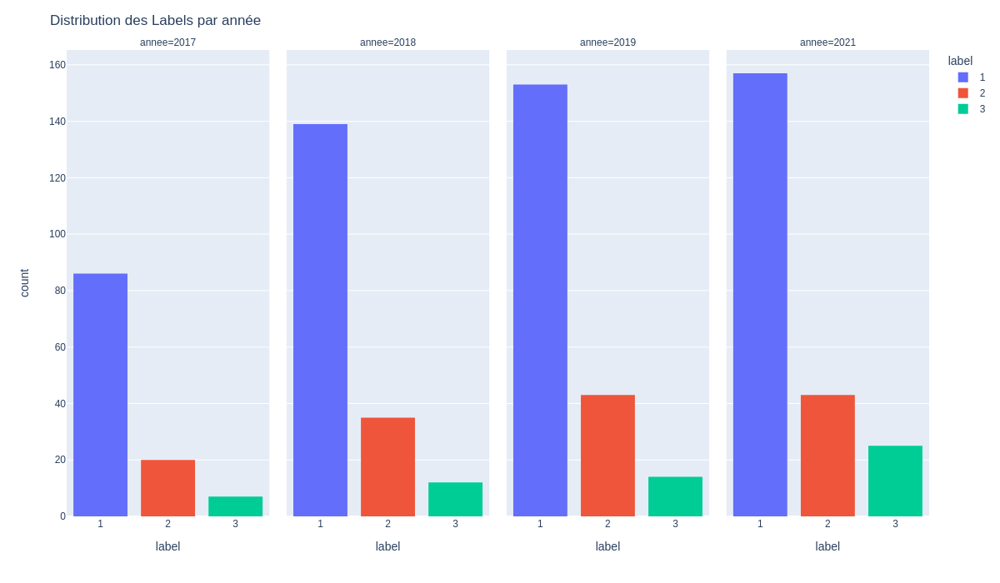

In [28]:
#transform the label to numeric
df_labels_numeriques["label"] = pd.to_numeric(df_labels_numeriques["label"])
#transform the annee to numeric
df_labels_numeriques["annee"] = pd.to_numeric(df_labels_numeriques["annee"])

#sorted by label ascending
df_labels_numeriques.sort_values(by=["label","annee"],inplace=True)

# re transform label in df_labels_numeriques_temp to str so it can be discrete value
df_labels_numeriques["label"] = df_labels_numeriques["label"].apply(str)
# re transform annee to str so it can be discrete value
df_labels_numeriques["annee"] = df_labels_numeriques["annee"].apply(str)

#plotting a histogram to show the distribution of the labels
fig = px.histogram(df_labels_numeriques, x="label", nbins=10, color="label", facet_col="annee" )
fig.update_layout(title_text="Distribution des Labels par année")
#fig.show()
image = fig.to_image(format='png',width=1200, height=700, scale=1)
Image(image)

**Interprétation :**


- D'après le graphique ci-dessus, on constate que le nombre des lycées labelisés augmente chaque année.
- Le niveau de label le plus répondu est le label 1 (qui est le niveau de label le plus faible)
- Le niveau de label le moins répondu est le label 3 (qui est le niveau de label le plus fort)

### Maps

#### Carte : positions géographiques des lycées labelisés dans la région occitanie

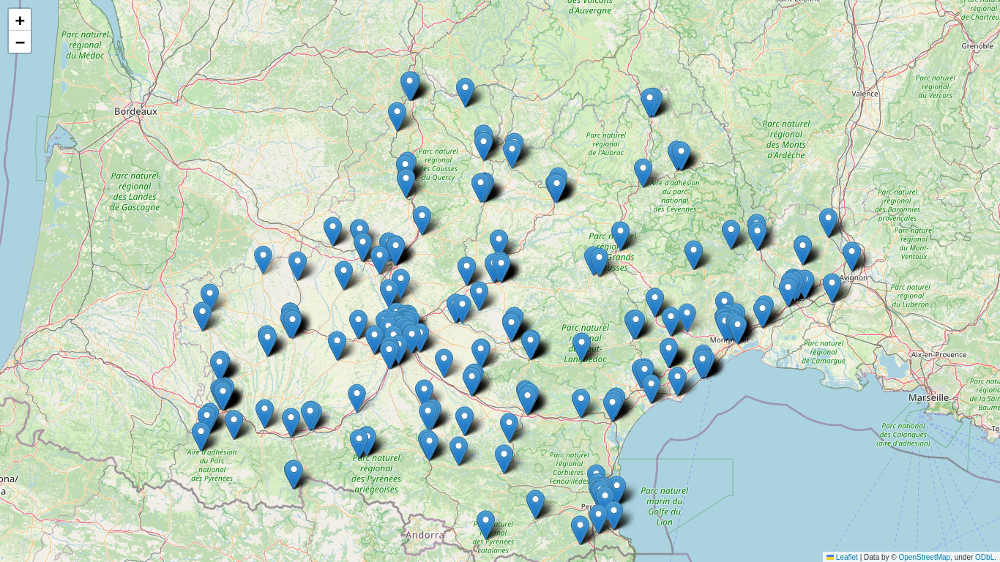

In [29]:
#creating the map
m = folium.Map(location=[43.9310426514, 2.15075998953], zoom_start=7.5)

#adding the markers to the map
for feature in labels_numeriques_geoGson['features']:
    label = feature['properties']['label']
    annee = feature['properties']['annee']
    localite = feature['properties']['localite']
    departement = feature['properties']['departement']
    nom_etablissement = feature['properties']['nom_etablissement']
    position = feature['properties']['position']
    rne = feature['properties']['rne']
    folium.Marker(position, popup=f'Label: {label}, Annee: {annee}, Localite: {localite}, Departement: {departement}, Nom_etablissement: {nom_etablissement}, RNE: {rne}').add_to(m)

#displaying the map
#m



img_data = m._to_png()
img = ImagePIL.open(io.BytesIO(img_data))
img

#### Carte : positions géographiques des lycées labelisés dans la région occitanie (avec le détail du niveau de label)

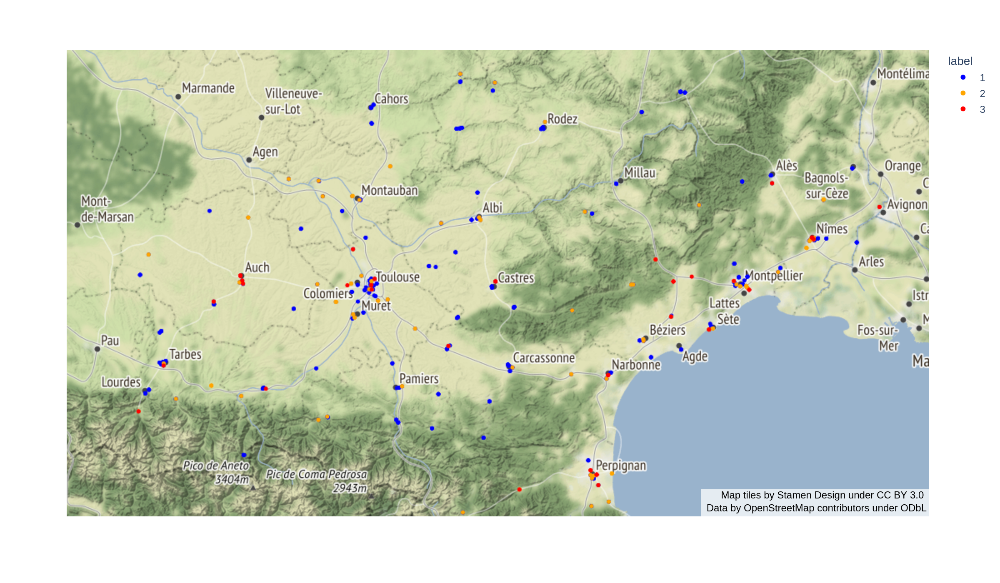

In [30]:
#transform the label to numeric
df_labels_numeriques["label"] = pd.to_numeric(df_labels_numeriques["label"])

#create df_labels_numeriques sorted by label ascending
df_labels_numeriques_temp = df_labels_numeriques.sort_values(by="label")

# re transform label in df_labels_numeriques_temp to str so it can be discrete value
df_labels_numeriques_temp["label"] = df_labels_numeriques_temp["label"].apply(str)

#plot map
fig = px.scatter_mapbox(df_labels_numeriques_temp, lat="latitude", lon="longitude", color="label",
                  color_discrete_map={'1' : 'blue', '2' : 'orange', '3' : "red"}, size_max=100, zoom=7,
                  mapbox_style='stamen-terrain')
#fig.show()
image = fig.to_image(format='png',width=1200, height=700, scale=2)
Image(image)

# PARTIE 4 : Analyse générale sur les lycées en occitanie

## Transform for visualisations

In [37]:
# re transform annee to str so it can be a discrete value for visualisations (discrete value)
df_result["annee_x"] = df_result["annee_x"].apply(str)
df_result["annee_y"] = df_result["annee_y"].apply(str)

df_result_all["annee_x"] = df_result_all["annee_x"].apply(str)
df_result_all["annee_y"] = df_result_all["annee_y"].apply(str)

## VISUALISATION 

### La proportion des Lycées labelisés et non labelisés pour lesquelles nous avons accès aux résultats des élèves

In [41]:
nbre_lycee_all = df_result_all['UAI'].nunique()
nbre_lycee_all_labelise = df_result_all['rne'].nunique()
nbre_lycee_all_non_labelise = nbre_lycee_all - nbre_lycee_all_labelise
values = [nbre_lycee_all_non_labelise,nbre_lycee_all_labelise]
labels = ["Nombre de lycées non labelisés pour lesquelles on connait le resultat", "Nombre de lycées labelisés pour lesquelles on connait le resultat"]

#plot figure
fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = "La proportions des Lycées labelisés / non labelisés")])
fig.show()

### La proportion des Lycées polyvalents et non polyvalents

In [44]:
# les lycées polyvalents et non polyvalents
df_lycee_polyvalent = pd.merge(df_lycee_gen, df_lycees_professionels, left_on="UAI", right_on="UAI",how="inner")

#calcul des proportions
nbre_lycee_all = df_lycee_all["UAI"].nunique()
nbre_lycee_polyvalent = df_lycee_polyvalent["UAI"].nunique()
nbre_lycee_non_polyvalent = nbre_lycee_all - nbre_lycee_polyvalent

#camamber data parameters
labels = ['lycées polyvalents', 'lycées non polyvalents']
values = [nbre_lycee_polyvalent,nbre_lycee_non_polyvalent]

#plot figure
fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = "La proportions des Lycées polyvalents et non polyvalents")])
fig.show()

### La proportion des Lycées polyvalents, professionels non polyvalents et d'enseignement générales et technologiques non polyvalents

In [47]:
#calcul du nombre des lycées profess non polyvalents
nbre_lycee_pro_polyvalent_inclus = df_lycees_professionels['UAI'].nunique()
nbre_lycee_pro_uniques = nbre_lycee_pro_polyvalent_inclus - nbre_lycee_polyvalent
#calcul du nombre des lycées générales non polyvalents
nbre_lycee_gen_polyvalent_inclus = df_lycee_gen["UAI"].nunique()
nbre_lycee_gen_uniques = nbre_lycee_gen_polyvalent_inclus - nbre_lycee_polyvalent

#data parameters for plotting camamber
labels=["Nombre de lycées d'enseignement générales et technologiques","Nombre de lycées professionels",
    "Nombre de lycées polyvalents"]
values=[nbre_lycee_gen_uniques,nbre_lycee_pro_uniques,nbre_lycee_polyvalent]

#plot figure
fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = "La proportions des Lycées polyvalents, professionels et d'enseignement générales et technologiques")])
fig.show()

### Histogram : La variation du nombre des lycées labelisés selon les années

In [49]:
# La variation du nombre des lycées labelisés selon les années
df_proportion_lycee_labelise_annee = df_result.groupby("annee_x")["rne"].nunique()
df_proportion_lycee_labelise_annee = df_proportion_lycee_labelise_annee.reset_index()

#plotting a histogram 
fig = px.histogram(df_proportion_lycee_labelise_annee, x="annee_x", y="rne",
          color="annee_x",
           labels={"UAI" : "nombre de lycee labelisés"})
fig.update_layout(title_text="La variation du nombre des lycées labelisés selon les années")
fig.show()

**On constate que le nombre de lycées professionels labelisés a augmenté de 87,17 % entre 2017 et 2021**

### Histogram : La variation du nombre des lycées non labelisés selon les années

In [51]:
# La variation du nombre des lycées non labelisés selon les années
df_proportion_lycee_non_labelise_annee = df_result_all.query("label_true == False").groupby("annee_y")["UAI"].nunique()
df_proportion_lycee_non_labelise_annee = df_proportion_lycee_non_labelise_annee.reset_index()

#plotting a histogram 
fig = px.histogram(df_proportion_lycee_non_labelise_annee, x="annee_y", y="UAI",
          color="annee_y",
           labels={"UAI" : "nombre de lycee non labelisés"})
fig.update_layout(title_text="La variation du nombre des lycées non labelisés selon les années")
fig.show()

**On constate que le nombre de lycées professionels non labelisés a diminué de 7.14% entre 2012 et 2021**

### Histogram : La variation du nombre des lycées professionels (labelisé ou non) selon les années

In [56]:
# La variation du nombre des lycées professionels (labelisé ou non) selon les années
df_lycees_professionels["annee"] = df_lycees_professionels["annee"].apply(str)
df_proportion_lycee_tout_annee = df_lycees_professionels.groupby("annee")["UAI"].nunique()
df_proportion_lycee_tout_annee = df_proportion_lycee_tout_annee.reset_index()
df_proportion_lycee_tout_annee

#plotting a histogram 
fig = px.histogram(df_proportion_lycee_tout_annee, x="annee", y="UAI",
          color="annee",
           labels={"UAI" : "nombre de lycee non labelisés"})
fig.update_layout(title_text="La variation du nombre des lycées professionels (labelisés et non labelisés) selon les années")
fig.show()

**Le nombre des lycées professionels (labelisés et non labelisé) a augmenté de 11.39% entre 2012 et 2021**

### Conclusion

**Au fil des années, les lycées non labelisés diminuent et obtiennent des labels et deviennent alors labelisés.
De ce fait le nombre des lycées labelisés augmentent.**
**Cependant, l'augmentation du nombre des lycées professionels labelisés (87,17%) entre 2017 et 2021, n'est pas seulement expliqué par la diminution du nombre des lycées non labelisés (7,14%) entre 2012 et 2021.
Cette augmentation est aussi du au fait que des nouveaux lycées labelisés sont introduits chaque année**

# PARTIE 5 : Analyse des résultats des lycées professionels en occitanie

## VISUALISATION

In [31]:
df_lycees_professionels["UAI"].nunique()

198

**Interprétation :**

- Il existe en total 198 lycées professionels en occitanie

### Analayse du taux de réussite au baccalauréat dans les lycées professionels 

#### Boxplot : Le taux de réussite au baccalauréat par secteur (privé/publique)

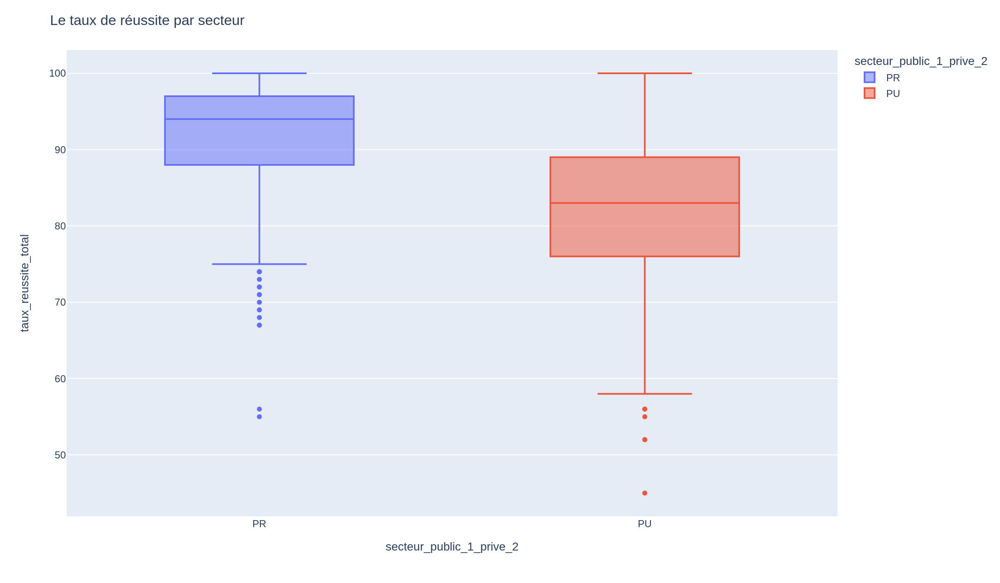

In [32]:
#plotting a boxplot 
fig = px.box(df_lycees_professionels, x="secteur_public_1_prive_2", y="taux_reussite_total", color="secteur_public_1_prive_2" )
fig.update_layout(title_text="Le taux de réussite par secteur ")
#fig.show()
image = fig.to_image(format='png',width=1200, height=700, scale=2)
Image(image)

**Interprétation :**

- On constate d'après le graphique ci-dessus que la médiane du taux de réussite au baccalauréat dans les
lycées professionels du secteur privé est (94) significativement plus élevé celle du secteur publique (83)

#### Boxplot : Le taux de réussite au baccalauréat par année

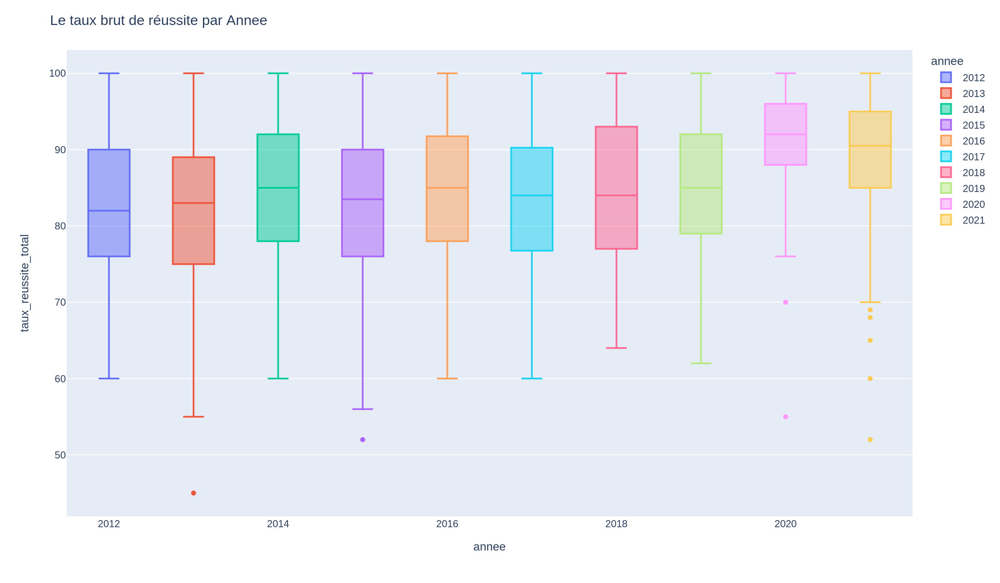

In [33]:
#plotting a boxplot 
fig = px.box(df_lycees_professionels, x="annee", y="taux_reussite_total", color="annee")
fig.update_layout(title_text="Le taux brut de réussite par Annee")
#fig.show()
image = fig.to_image(format='png',width=1200, height=700, scale=2)
Image(image)

**Interprétation :**


- On constate d'après le graphique ci-dessus que la médiane du taux de réussite au baccalauréat dans les lycées professionels est maximal à l'année 2020 (92%) et minimal à l'année 2012 (82%)

#### Histogram : La moyenne des taux de réussites (tous secteurs) par annee

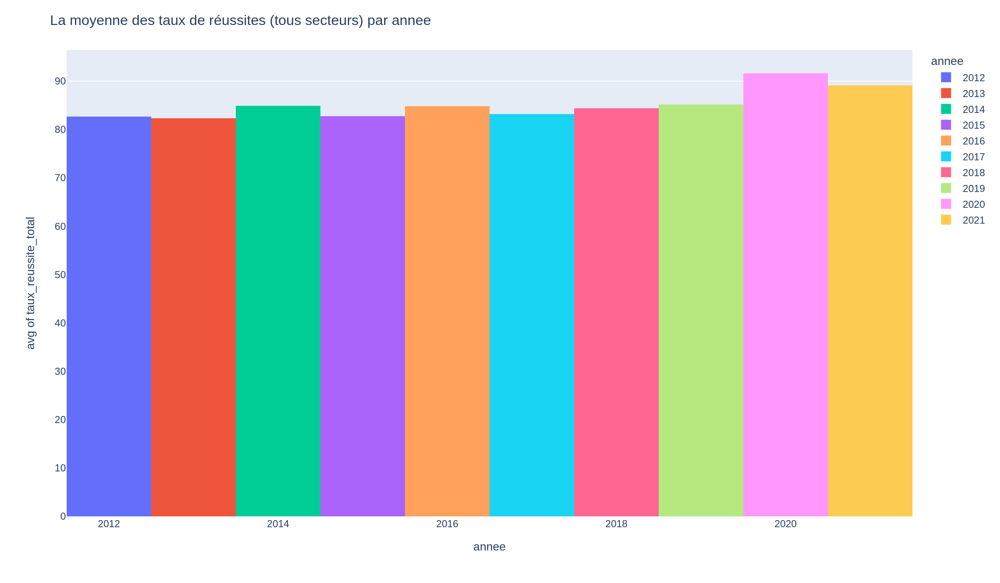

In [34]:
#plotting a histogram to show the distribution of the labels
fig = px.histogram(df_lycees_professionels, x="annee", y="taux_reussite_total", nbins=10, histfunc="avg", color="annee")
fig.update_layout(title_text="La moyenne des taux de réussites (tous secteurs) par annee")
#fig.show()
image = fig.to_image(format='png',width=1200, height=700, scale=2)
Image(image)

**Interprétation :**


- On constate d'après le graphique ci-dessus que la moyenne du taux de réussite au baccalauréat dans les lycées professionels est maximal à l'année 2020 (91,6%) et minimal à l'année 2013 (82,3%)

# PARTIE 6 : Analyse des résultats des lycées d'enseignement général et technologique en Occitanie

## VISUALISATIONS

### Analayse du taux de réussite au baccalauréat dans les lycées d'enseignement Général et technologique 

#### Boxplot : Le taux de réussite au baccalauréat par secteur (privé/publique)

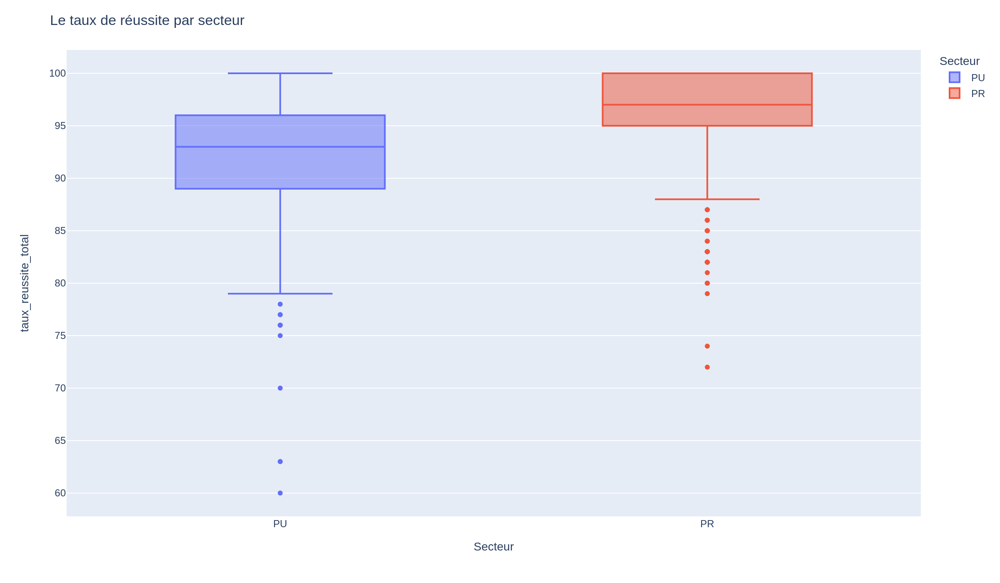

In [35]:
#plotting a boxplot 
fig = px.box(df_lycee_gen, x="Secteur", y="taux_reussite_total", color="Secteur" )
fig.update_layout(title_text="Le taux de réussite par secteur ")
#fig.show()
image = fig.to_image(format='png',width=1200, height=700, scale=2)
Image(image)

**Interprétation :**


- On constate d'après le graphique ci-dessus que la médiane du taux de réussite au baccalauréat dans les lycées d'enseignement Général et technologique du secteur privé est **(97%)** significativement plus élevé celle du secteur publique **(93%)**.
- En comparant que boxplot ci-dessus à celui des lycées professionels que nous avons établis précédemment, on constate aussi que le taux de réussite au baccalauréat dans les lycées d'enseignement Général et technologique est plus elevé que le taux de réussite au baccalauréat dans les lycées professionels

#### Boxplot : Le taux de réussite au baccalauréat par année

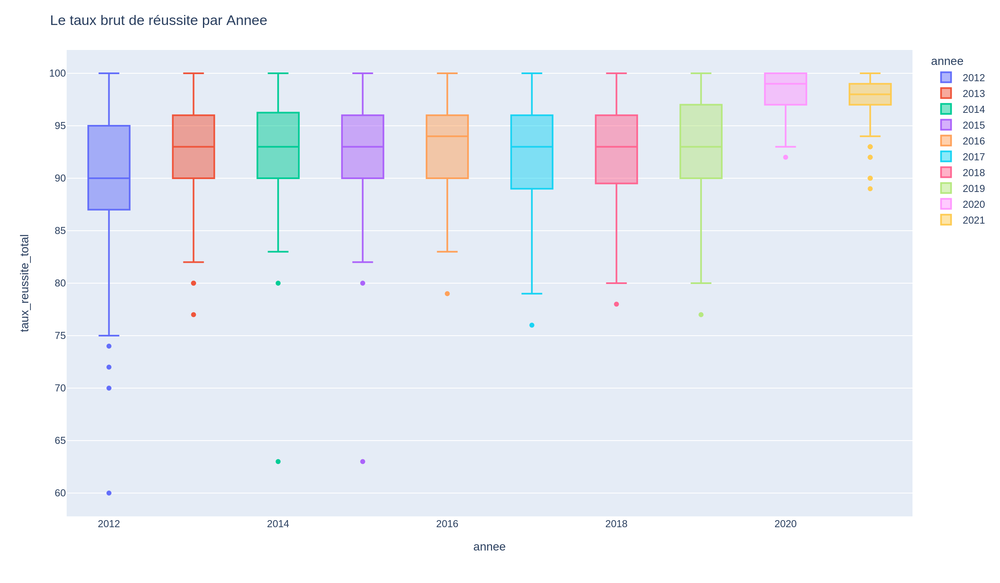

In [36]:
#plotting a boxplot 
fig = px.box(df_lycee_gen, x="annee", y="taux_reussite_total", color="annee")
fig.update_layout(title_text="Le taux brut de réussite par Annee")
#fig.show()
image = fig.to_image(format='png',width=1200, height=700, scale=2)
Image(image)

**Interprétation :**


- On constate d'après le graphique ci-dessus que la médiane du taux de réussite au baccalauréat dans les lycées d'enseignement Général et technologique est maximal à l'année 2020 (99%) et minimal à l'année 2012 (90%)